# **0 包**

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import random
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import cv2
from PIL import Image
from pathlib import Path
from torchvision.transforms import functional as F
import torch.nn.functional as F
from tqdm import tqdm
import time
from torchsummary import summary

In [61]:
writer = SummaryWriter('runs/GTSRB_new')

In [3]:
seed = 3407
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

In [46]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# **1 引言（Introduction）**

&emsp;&emsp;交通标志识别技术是自动驾驶技术和辅助驾驶技术的重要组成部分，是即将到来的智能交通时代的前提基础，对于车辆的安全行驶和决策至关重要。因此, 如何准确高效地识别实景交通标志是近年来研究的热点之一。<br>
&emsp;&emsp;深度学习是目前在目标识别方面应用最多的方法,而深度学习中最著名的就是卷积神经网络(CNN)，但仍存在算法复杂度较高,检测和识别的时间较长,不能满足检测实时性的要求的不足。<br>
&emsp;&emsp;作为一次大作业，本文将在已有研究的基础上，尝试改进卷积神经网络结构以求在保证较高的识别准确率的情况下用时更少。

#**2 相关工作（Related Work）**

&emsp;&emsp;深度学习在特征学习方面展现了强大的能力，而深度卷积神经网络（CNN）是深度学习在计算机视觉领域中应用最广泛的模型之一。<sup>[1]</sup>

&emsp;&emsp;Sermanet等人<sup>[2]</sup>提出多尺度CNN(multi-scale convolutional networks)应用于交通标志识别任务,达到99.17%的准确率。Ciresan等人<sup>[3]</sup>使用多列深度卷积神经网络(Multi-Column Deep Neural Network, MCDNN)在 GTSRB 数据集上获得 99.46% 的准确率,但是运算量大。尽管前两个网络的准确度很高,但它们的计算效率不高,需要在硬件上进行大量的乘法运算,采用的激活函数计算效率也不高，Aghdam 等人<sup>[4]</sup>为减少计算量,选用线性整流函数(Rectified Linear Unit, ReLU)激活函数,然后将两个中间卷积池化层划分成两组,使得中间层的参数数量减半。网络模型去除了神经网络冗余参数,同时也提高了交通标志识别的准确率和实时性,算法的识别率提高到99.51%。清华大学的Jin 等人<sup>[5]</sup>提出了一种铰链损失随机梯度下降(Hinge Loss Stochastic Gradient Descent, HLSGD)方法训练 CNN, HLSGD 方法比之前网络模型所使用的随机梯度下降(Stochastic Gradient Descent, SGD)方法训练得更快,收敛更稳定,在GTSRB上的识别率为99.65%，该方法准确率已经比较高,但是需要学习大量的参数,训练时间还是比较长。

&emsp;&emsp;在交通标志识别的实景应用中对于识别的准确性和实时性都有着较高的要求，这就使得网络结构的设计需要在两者之间取得平衡，从而尽可能将准确性和实时性两个条件都满足。

&emsp;&emsp;据此，本次实验采用**轻量化的卷积神经网络结构**，结合**双池化方法**和 **HLSGD**，以在保持准确率的同时提高实时性。

#**3 方法（Methodology）**

## **3.1 改进的卷积神经网络**

### **3.1.1 双池化处理**

&emsp;&emsp;卷积神经网络的层数越深、卷积核数目越多，卷积神经网络的结构就越复杂，进而识别的准确率也越高。但与此同时，复杂的网络结构也会使得系统运行的网络训练和识别时间增加，这将会降低识别系统的时间效率。

&emsp;&emsp;在卷积神经网络的训练和运行中，卷积操作这一环节占据总用时的很大比例<sup>[6]</sup>，而池化等其它操作则用时较少。这样，相应地减少卷积核的数量就可以使总用时大为缩减。同时，增加池化类型，即增加采样数量则可以弥补卷积核减少所带来的准确性影响。**本文采取平均池化方法和最大值池化方法这两种方法进行采样**。

### ~~**3.1.2 深度可分离卷积**~~（损失不下降，暂不采用）

&emsp;&emsp;在传统卷积中，卷积核会同时跨越所有输入通道，生成一个新的特征图。假设输入特征图大小为$H*W$，输入通道数为 $M$，输出通道数为 $N$，卷积核大小为 $K*K$，计算量为：
$$H*W*M*N*K*K$$
&emsp;&emsp;**深度可分离卷积（Depthwise Separable Convolution）**是一种用于降低卷积神经网络计算量和参数数量的技术，特别在轻量化网络（如 MobileNet）中被广泛使用，它将传统卷积分解为两步：
*   **深度卷积**<br>
  每个输入通道都独立应用一个 $K*K$ 的卷积核，得到一个输出特征图。因此，如果输入有 M 个通道，输出特征图仍然有 $M$ 个通道。于是计算量为
$$H*W*K*K*M$$
*   **逐点卷积**<br>
使用 $1*1$ 的卷积核在每个输入通道上进行卷积，将 $M$ 个输入通道组合成 $N$ 个输出通道。计算量为：
$$H*W*M*N$$

*   **总计算量**
$$H*W*K*K*M+H*W*M*N$$

&emsp;&emsp;通过可分离卷积可以做到计算量缩减，从而有效满足智能驾驶中对于交通标志检测准确性和时效性的需求。

### **3.1.3 改进的CNN结构**

本实验的改进卷积神经网络结构具体结构如下：

| 层                 | 类型                     | 输出形状         | 核/窗口大小  | 参数数量   |
|--------------------|--------------------------|------------------|--------------|------------|
| conv1              | 卷积层                   | 16 x 32 x 32     | 5 x 5        | 1,216      |
| pool               | 双池化层                 | 16 x 16 x 16     | 2 x 2        | 0          |
| bn1                | 批量归一化层             | 16 x 16 x 16     | -            | 32         |
| conv2              | 卷积层                   | 64 x 16 x 16     | 5 x 5        | 51,264     |
| pool               | 双池化层                 | 64 x 8 x 8       | 2 x 2        | 0          |
| bn2                | 批量归一化层             | 64 x 8 x 8       | -            | 64         |
| conv3              | 卷积层                   | 256 x 8 x 8      | 5 x 5        | 819,456    |
| pool               | 双池化层                 | 256 x 4 x 4      | 2 x 2        | 0          |
| bn3                | 批量归一化层             | 256 x 4 x 4      | -            | 1,024      |
| fc1                | 全连接层                 | 1024             | -            | 8,389,632  |
| fc2                | 全连接层                 | 128              | -            | 131,200    |
| fc3                | 全连接层                 | 43               | -            | 5,547      |
| **总参数量**       |                          |                  |              | **9,399,659** |



(1) 输入层为 $32*32$ 的彩色图片数据

(2) 共有 3 个卷积层，卷积核均大小为 $5*5$，步长stride为1，同时周围进行大小为2的零填充使得卷积层的结果与输入层图像大小相同。

(3) 网络包含 3 个池化层，每个池化层中含有两种池化方式：平均池化和最大值池化。对卷积层输出的每个特征图进行这两种不同的采样。池化窗口大小均为 $3*3$ ，stride 为 1，并在周围进行大小为 1 的 padding 。因为每个池化层包含两种池化方式，池化层的输出通道数是卷积层输出通道数的两倍。

(4) 在每一个池化层之后，都设有一个归一化层。

(5) 网络设有2个全连接层和1个输出层。

(6) 在全连接层采用Dropout操作, 使网络中的神经元随机失活, 其Dropout概率设为0.5。

In [62]:
class CNN(nn.Module):
  def __init__(self):
    super(CNN, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=1, padding=2)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(128)
    self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=5, stride=1, padding=2)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))             # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.conv2(x))             # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.conv3(x))             # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  #512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model = CNN().to(device)
summary(model, input_size=(3, 32, 32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]           1,216
         MaxPool2d-2           [-1, 16, 16, 16]               0
         AvgPool2d-3           [-1, 16, 16, 16]               0
       BatchNorm2d-4           [-1, 32, 16, 16]              64
            Conv2d-5           [-1, 64, 16, 16]          51,264
         MaxPool2d-6             [-1, 64, 8, 8]               0
         AvgPool2d-7             [-1, 64, 8, 8]               0
       BatchNorm2d-8            [-1, 128, 8, 8]             256
            Conv2d-9            [-1, 256, 8, 8]         819,456
        MaxPool2d-10            [-1, 256, 4, 4]               0
        AvgPool2d-11            [-1, 256, 4, 4]               0
      BatchNorm2d-12            [-1, 512, 4, 4]           1,024
           Linear-13                 [-1, 1024]       8,389,632
          Dropout-14                 [-

# **4 实验设置（Experiment Setup）**

## **4.1 数据集**

&emsp;&emsp;German Traffic Sign Recognition Benchmark（GTSRB） 是一个用于交通标志识别的公开数据集。该数据集由德国的多所大学和研究机构联合创建，旨在促进自动驾驶和驾驶辅助系统中交通标志识别技术的发展和研究。

In [6]:
# 等等显示每类图像看
def plot_samples_per_class(dataset, num_samples=3, num_classes=43):
    images_per_class = {i: [] for i in range(num_classes)}

    for image, label in dataset:
        if len(images_per_class[label]) < num_samples:
            images_per_class[label].append(image)
        if all(len(images_per_class[i]) == num_samples for i in range(num_classes)):
            break

    fig, axs = plt.subplots(num_classes, num_samples, figsize=(num_samples * 2, num_classes * 2))
    for i in range(num_classes):
        for j in range(num_samples):
            image = images_per_class[i][j]
            # 转换为 numpy 数组，并调整维度
            image = image.permute(1, 2, 0).numpy()  # (C, H, W) -> (H, W, C)
            # 反标准化
            image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
            image = np.clip(image, 0, 1)  # 确保在 [0, 1] 范围内

            axs[i, j].imshow(image)
            axs[i, j].axis('off')
            if j == 0:
                axs[i, j].set_title(f"Class {i}")

    plt.tight_layout()
    plt.show()

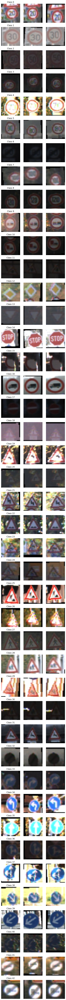

In [ ]:
# 绘制样本图像
plot_samples_per_class(train_dataset)

## **4.2 数据预处理**

&emsp;&emsp;在实际应用中，交通标志识别往往是在动态的、复杂的环境里，这就存在光照不足、光超过高(光照不均匀)、动态模糊、分辨率低、背景复杂、部分遮挡、倾斜形变等等问题会导致识别不准确。

&emsp;&emsp;为了提高模型的泛化性能，采用了随机平移、旋转和缩放还有归一化的数据增强技术。这些方法使模型能够解决数据集不平衡问题，可以在有限的数据集上训练出更为稳健的特征。

In [63]:
train_transforms = transforms.Compose([
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [64]:
train_dataset = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms
)

test_dataset = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms
)

## **4.4 超参数**

In [65]:
lr = 1e-3
epochs = 100
batch_size = 32

## **4.4 优化器和损失函数**

&emsp;&emsp;文献 [5] 提出了一种铰链损失随机梯度下降(Hinge Loss Stochastic Gradient Descent, HLSGD)方法训练CNN。铰链损失随机梯度下降顾名思义，就是铰链损失+随机梯度下降，而取代原先交叉熵损失的**铰链损失(Hinge Loss)**的数学表达式如下：
$$
\text{Hinge Loss} = \frac{1}{N} \sum_{i=1}^{N} \sum_{j \neq y_i} \max(0, 1 + f(x_i, j) - f(x_i, y_i))
$$
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;其中：<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$N$ 表示训练集中样本总数；<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$y_i$ 表示第 $i$ 个样本的真实类别；<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$f(x_i, y_i)$ 表示模型对于输入 $x_i$ 在真实类别 $y_i$ 上的得分;<br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;$j$ 表示除真实类别 $y_i$ 以外的所有类别。<br><br>
&emsp;&emsp;也就是说它只在样本未被正确分类或边距不足时产生非零损失，从而使模型将注意力集中在难分类的样本上。而传统的交叉熵损失在已经正确分类的样本上也仍然花费计算资源来优化概率。在**5.2.2.2**中通过直方图可以发现存在一些分类识别不佳的情况，所以这对本问题中识别效果不佳的分类存在意义，所以使用铰链损失可以有效减少了计算量，加快训练速度，让模型专注于区分难分类的样本从而提升模型泛化能力。<br><br>
&emsp;&emsp;**本次实验先利用 Adam 的快速收敛特性找到较好的初始解，然后切换为 SGD 进行更稳定的训练和微调，从而提高模型的泛化能力。**

In [66]:
# 铰链损失
criterion = nn.MultiMarginLoss()
# 优化器
optimizer = optim.Adam(model.parameters(), lr=lr)
# 学习率调度器
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.1, patience=5, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


**注：学习率与学习率调度器经过多次调整，如果如果初始lr和step_size设置较小，会导致后续损失下降极慢。(如下)<br>**
Training: 100%|██████████| 833/833 [00:54<00:00, 15.26batch/s]<br>
Epoch [25/100], Loss: 0.0425, Accuracy: 0.6971<br>
Training: 100%|██████████| 833/833 [00:53<00:00, 15.46batch/s]<br>
Epoch [26/100], Loss: 0.0408, Accuracy: 0.6999<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.20batch/s]<br>
Epoch [27/100], Loss: 0.0408, Accuracy: 0.7016<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.27batch/s]<br>
Epoch [28/100], Loss: 0.0411, Accuracy: 0.7009<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.42batch/s]<br>
Epoch [29/100], Loss: 0.0408, Accuracy: 0.7016<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.23batch/s]<br>
Epoch [30/100], Loss: 0.0403, Accuracy: 0.7032<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.36batch/s]<br>
Epoch [31/100], Loss: 0.0396, Accuracy: 0.7084<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.34batch/s]<br>
Epoch [32/100], Loss: 0.0394, Accuracy: 0.7090<br>
Training: 100%|██████████| 833/833 [00:54<00:00, 15.34batch/s]<br>
Epoch [33/100], Loss: 0.0399, Accuracy: 0.7103<br>
Training: 100%|██████████| 833/833 [00:53<00:00, 15.43batch/s]<br>
Epoch [34/100], Loss: 0.0391, Accuracy: 0.7097<br>
Training: 100%|██████████| 833/833 [00:53<00:00, 15.50batch/s]<br>
Epoch [35/100], Loss: 0.0392, Accuracy: 0.7110<br>
Training:  58%|█████▊    | 481/833 [00:31<00:23, 15.13batch/s]<br>

## **4.5 训练**

In [67]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

In [68]:
# 日志
sample_data, _ = next(iter(train_loader))
sample_data = sample_data.to(device)
writer.add_graph(model, sample_data)

In [69]:
def load_checkpoint(model, optimizer, checkpoint_path):
  checkpoint = torch.load(checkpoint_path)

  model.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

  start_epoch = checkpoint['epoch']
  best_accuracy = checkpoint['accuracy']

  return start_epoch, best_accuracy

In [70]:
# 定义早停参数
patience = 5            # 早停的耐心值
best_accuracy = 0.0     # 记录最佳准确率
trigger_times = 0      # 触发次数

# 定义是否恢复训练
checkpoint_path = Path('full_training_state.pth')
start_epoch = 0

if checkpoint_path.exists():
  start_epoch, best_accuracy = load_checkpoint(model, optimizer, 'full_training_state.pth')

In [71]:
for epoch in range(start_epoch, epochs):
  running_loss = 0.0
  total_loss = 0.0  # 记录整个 epoch 的总损失
  total_correct = 0
  total_samples = 0

  model.train()  # 设置为训练模式
  for i, (x, y) in enumerate(tqdm(train_loader, desc="Training", unit="batch")):
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU

    # 前向传播
    predictions = model(x)
    loss = criterion(predictions, y)

    # 反向传播
    optimizer.zero_grad()  # 梯度清零
    loss.backward()        # 反向传播
    optimizer.step()       # 更新参数

    # 记录损失
    running_loss += loss.item()

    # 计算准确率
    _, predicted = torch.max(predictions, 1)
    total_correct += (predicted == y).sum().item()
    total_samples += y.size(0)

    if i % 100 == 99:  # 每隔100个batch记录一次log
      writer.add_scalar('Loss/train', running_loss / 100, epoch * len(train_loader) + i)

  # 计算整个 epoch 的平均损失和准确率
  avg_loss = running_loss / len(train_loader)
  accuracy = total_correct / total_samples
  print(f"Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.6f}, Accuracy: {accuracy:.4f}")

  # 记录到 TensorBoard
  writer.add_scalar('Loss/train', avg_loss, epoch)
  writer.add_scalar('Accuracy/train', accuracy, epoch)

  # 更新学习率
  scheduler.step(avg_loss)

  # 保存模型
  torch.save({
    'epoch': epoch + 1,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'loss': avg_loss,
    'accuracy': accuracy,
  }, checkpoint_path)

writer.close()

Training: 100%|██████████| 833/833 [00:44<00:00, 18.75batch/s]


Epoch [1/100], Loss: 0.536070, Accuracy: 0.1310


Training: 100%|██████████| 833/833 [00:44<00:00, 18.75batch/s]


Epoch [2/100], Loss: 0.222213, Accuracy: 0.2722


Training: 100%|██████████| 833/833 [00:44<00:00, 18.77batch/s]


Epoch [3/100], Loss: 0.159851, Accuracy: 0.3494


Training: 100%|██████████| 833/833 [00:44<00:00, 18.81batch/s]


Epoch [4/100], Loss: 0.107566, Accuracy: 0.4479


Training: 100%|██████████| 833/833 [00:44<00:00, 18.69batch/s]


Epoch [5/100], Loss: 0.077140, Accuracy: 0.5452


Training: 100%|██████████| 833/833 [00:44<00:00, 18.77batch/s]


Epoch [6/100], Loss: 0.054308, Accuracy: 0.6383


Training: 100%|██████████| 833/833 [00:44<00:00, 18.79batch/s]


Epoch [7/100], Loss: 0.040044, Accuracy: 0.7006


Training: 100%|██████████| 833/833 [00:44<00:00, 18.82batch/s]


Epoch [8/100], Loss: 0.036372, Accuracy: 0.7365


Training: 100%|██████████| 833/833 [00:44<00:00, 18.82batch/s]


Epoch [9/100], Loss: 0.028620, Accuracy: 0.7813


Training: 100%|██████████| 833/833 [00:44<00:00, 18.81batch/s]


Epoch [10/100], Loss: 0.033128, Accuracy: 0.7765


Training: 100%|██████████| 833/833 [00:44<00:00, 18.75batch/s]


Epoch [11/100], Loss: 0.018426, Accuracy: 0.8402


Training: 100%|██████████| 833/833 [00:44<00:00, 18.83batch/s]


Epoch [12/100], Loss: 0.020118, Accuracy: 0.8463


Training: 100%|██████████| 833/833 [00:44<00:00, 18.85batch/s]


Epoch [13/100], Loss: 0.017690, Accuracy: 0.8614


Training: 100%|██████████| 833/833 [00:44<00:00, 18.79batch/s]


Epoch [14/100], Loss: 0.017126, Accuracy: 0.8747


Training: 100%|██████████| 833/833 [00:44<00:00, 18.83batch/s]


Epoch [15/100], Loss: 0.012723, Accuracy: 0.8954


Training: 100%|██████████| 833/833 [00:44<00:00, 18.83batch/s]


Epoch [16/100], Loss: 0.014179, Accuracy: 0.8960


Training: 100%|██████████| 833/833 [00:44<00:00, 18.74batch/s]


Epoch [17/100], Loss: 0.025296, Accuracy: 0.8757


Training: 100%|██████████| 833/833 [00:44<00:00, 18.69batch/s]


Epoch [18/100], Loss: 0.013650, Accuracy: 0.9012


Training: 100%|██████████| 833/833 [00:44<00:00, 18.70batch/s]


Epoch [19/100], Loss: 0.009735, Accuracy: 0.9233


Training: 100%|██████████| 833/833 [00:44<00:00, 18.80batch/s]


Epoch [20/100], Loss: 0.012094, Accuracy: 0.9180


Training: 100%|██████████| 833/833 [00:44<00:00, 18.83batch/s]


Epoch [21/100], Loss: 0.011332, Accuracy: 0.9236


Training: 100%|██████████| 833/833 [00:44<00:00, 18.80batch/s]


Epoch [22/100], Loss: 0.009304, Accuracy: 0.9331


Training: 100%|██████████| 833/833 [00:44<00:00, 18.82batch/s]


Epoch [23/100], Loss: 0.009691, Accuracy: 0.9349


Training: 100%|██████████| 833/833 [00:44<00:00, 18.89batch/s]


Epoch [24/100], Loss: 0.015446, Accuracy: 0.9164


Training: 100%|██████████| 833/833 [00:44<00:00, 18.68batch/s]


Epoch [25/100], Loss: 0.010407, Accuracy: 0.9343


Training: 100%|██████████| 833/833 [00:44<00:00, 18.66batch/s]


Epoch [26/100], Loss: 0.007596, Accuracy: 0.9438


Training: 100%|██████████| 833/833 [00:44<00:00, 18.77batch/s]


Epoch [27/100], Loss: 0.024695, Accuracy: 0.9094


Training: 100%|██████████| 833/833 [00:44<00:00, 18.80batch/s]


Epoch [28/100], Loss: 0.018083, Accuracy: 0.9127


Training: 100%|██████████| 833/833 [00:44<00:00, 18.79batch/s]


Epoch [29/100], Loss: 0.007743, Accuracy: 0.9465


Training: 100%|██████████| 833/833 [00:44<00:00, 18.84batch/s]


Epoch [30/100], Loss: 0.005518, Accuracy: 0.9566


Training: 100%|██████████| 833/833 [00:44<00:00, 18.77batch/s]


Epoch [31/100], Loss: 0.008212, Accuracy: 0.9508


Training: 100%|██████████| 833/833 [00:44<00:00, 18.79batch/s]


Epoch [32/100], Loss: 0.010951, Accuracy: 0.9399


Training: 100%|██████████| 833/833 [00:44<00:00, 18.84batch/s]


Epoch [33/100], Loss: 0.007256, Accuracy: 0.9527


Training: 100%|██████████| 833/833 [00:46<00:00, 17.79batch/s]


Epoch [34/100], Loss: 0.008655, Accuracy: 0.9504


Training: 100%|██████████| 833/833 [00:44<00:00, 18.63batch/s]


Epoch [35/100], Loss: 0.007160, Accuracy: 0.9547


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [36/100], Loss: 0.017932, Accuracy: 0.9288


Training: 100%|██████████| 833/833 [00:44<00:00, 18.65batch/s]


Epoch [37/100], Loss: 0.006138, Accuracy: 0.9588


Training: 100%|██████████| 833/833 [00:44<00:00, 18.66batch/s]


Epoch [38/100], Loss: 0.004199, Accuracy: 0.9689


Training: 100%|██████████| 833/833 [00:44<00:00, 18.71batch/s]


Epoch [39/100], Loss: 0.003879, Accuracy: 0.9718


Training: 100%|██████████| 833/833 [00:44<00:00, 18.67batch/s]


Epoch [40/100], Loss: 0.003563, Accuracy: 0.9737


Training: 100%|██████████| 833/833 [00:44<00:00, 18.71batch/s]


Epoch [41/100], Loss: 0.003127, Accuracy: 0.9750


Training: 100%|██████████| 833/833 [00:44<00:00, 18.73batch/s]


Epoch [42/100], Loss: 0.002673, Accuracy: 0.9782


Training: 100%|██████████| 833/833 [00:44<00:00, 18.69batch/s]


Epoch [43/100], Loss: 0.002742, Accuracy: 0.9792


Training: 100%|██████████| 833/833 [00:44<00:00, 18.72batch/s]


Epoch [44/100], Loss: 0.002571, Accuracy: 0.9801


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [45/100], Loss: 0.003251, Accuracy: 0.9801


Training: 100%|██████████| 833/833 [00:44<00:00, 18.61batch/s]


Epoch [46/100], Loss: 0.002300, Accuracy: 0.9824


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [47/100], Loss: 0.002381, Accuracy: 0.9821


Training: 100%|██████████| 833/833 [00:44<00:00, 18.69batch/s]


Epoch [48/100], Loss: 0.002375, Accuracy: 0.9814


Training: 100%|██████████| 833/833 [00:44<00:00, 18.58batch/s]


Epoch [49/100], Loss: 0.001869, Accuracy: 0.9841


Training: 100%|██████████| 833/833 [00:44<00:00, 18.66batch/s]


Epoch [50/100], Loss: 0.002039, Accuracy: 0.9841


Training: 100%|██████████| 833/833 [00:44<00:00, 18.67batch/s]


Epoch [51/100], Loss: 0.002102, Accuracy: 0.9837


Training: 100%|██████████| 833/833 [00:44<00:00, 18.58batch/s]


Epoch [52/100], Loss: 0.001685, Accuracy: 0.9861


Training: 100%|██████████| 833/833 [00:44<00:00, 18.66batch/s]


Epoch [53/100], Loss: 0.001813, Accuracy: 0.9849


Training: 100%|██████████| 833/833 [00:44<00:00, 18.53batch/s]


Epoch [54/100], Loss: 0.001729, Accuracy: 0.9860


Training: 100%|██████████| 833/833 [00:45<00:00, 18.33batch/s]


Epoch [55/100], Loss: 0.001993, Accuracy: 0.9860


Training: 100%|██████████| 833/833 [00:45<00:00, 18.27batch/s]


Epoch [56/100], Loss: 0.001642, Accuracy: 0.9858


Training: 100%|██████████| 833/833 [00:44<00:00, 18.58batch/s]


Epoch [57/100], Loss: 0.001895, Accuracy: 0.9859


Training: 100%|██████████| 833/833 [00:44<00:00, 18.54batch/s]


Epoch [58/100], Loss: 0.001679, Accuracy: 0.9867


Training: 100%|██████████| 833/833 [00:44<00:00, 18.57batch/s]


Epoch [59/100], Loss: 0.001868, Accuracy: 0.9867


Training: 100%|██████████| 833/833 [00:45<00:00, 18.42batch/s]


Epoch [60/100], Loss: 0.001586, Accuracy: 0.9867


Training: 100%|██████████| 833/833 [00:44<00:00, 18.69batch/s]


Epoch [61/100], Loss: 0.001239, Accuracy: 0.9884


Training: 100%|██████████| 833/833 [00:44<00:00, 18.72batch/s]


Epoch [62/100], Loss: 0.001241, Accuracy: 0.9881


Training: 100%|██████████| 833/833 [00:44<00:00, 18.72batch/s]


Epoch [63/100], Loss: 0.001648, Accuracy: 0.9871


Training: 100%|██████████| 833/833 [00:44<00:00, 18.67batch/s]


Epoch [64/100], Loss: 0.001275, Accuracy: 0.9889


Training: 100%|██████████| 833/833 [00:45<00:00, 18.44batch/s]


Epoch [65/100], Loss: 0.001282, Accuracy: 0.9887


Training: 100%|██████████| 833/833 [00:45<00:00, 18.51batch/s]


Epoch [66/100], Loss: 0.001229, Accuracy: 0.9885


Training: 100%|██████████| 833/833 [00:44<00:00, 18.55batch/s]


Epoch [67/100], Loss: 0.001201, Accuracy: 0.9900


Training: 100%|██████████| 833/833 [00:44<00:00, 18.54batch/s]


Epoch [68/100], Loss: 0.001240, Accuracy: 0.9887


Training: 100%|██████████| 833/833 [00:44<00:00, 18.60batch/s]


Epoch [69/100], Loss: 0.001441, Accuracy: 0.9887


Training: 100%|██████████| 833/833 [00:44<00:00, 18.86batch/s]


Epoch [70/100], Loss: 0.001004, Accuracy: 0.9899


Training: 100%|██████████| 833/833 [00:46<00:00, 17.91batch/s]


Epoch [71/100], Loss: 0.001447, Accuracy: 0.9895


Training: 100%|██████████| 833/833 [00:45<00:00, 18.26batch/s]


Epoch [72/100], Loss: 0.001082, Accuracy: 0.9910


Training: 100%|██████████| 833/833 [00:45<00:00, 18.14batch/s]


Epoch [73/100], Loss: 0.001378, Accuracy: 0.9892


Training: 100%|██████████| 833/833 [00:45<00:00, 18.35batch/s]


Epoch [74/100], Loss: 0.001134, Accuracy: 0.9905


Training: 100%|██████████| 833/833 [00:45<00:00, 18.47batch/s]


Epoch [75/100], Loss: 0.001296, Accuracy: 0.9891


Training: 100%|██████████| 833/833 [00:45<00:00, 18.45batch/s]


Epoch [76/100], Loss: 0.001154, Accuracy: 0.9899


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [77/100], Loss: 0.000997, Accuracy: 0.9907


Training: 100%|██████████| 833/833 [00:44<00:00, 18.58batch/s]


Epoch [78/100], Loss: 0.001343, Accuracy: 0.9913


Training: 100%|██████████| 833/833 [00:44<00:00, 18.60batch/s]


Epoch [79/100], Loss: 0.000890, Accuracy: 0.9913


Training: 100%|██████████| 833/833 [00:44<00:00, 18.58batch/s]


Epoch [80/100], Loss: 0.000970, Accuracy: 0.9909


Training: 100%|██████████| 833/833 [00:44<00:00, 18.59batch/s]


Epoch [81/100], Loss: 0.001129, Accuracy: 0.9922


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [82/100], Loss: 0.001159, Accuracy: 0.9916


Training: 100%|██████████| 833/833 [00:44<00:00, 18.60batch/s]


Epoch [83/100], Loss: 0.000861, Accuracy: 0.9915


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [84/100], Loss: 0.001457, Accuracy: 0.9907


Training: 100%|██████████| 833/833 [00:44<00:00, 18.56batch/s]


Epoch [85/100], Loss: 0.001225, Accuracy: 0.9913


Training: 100%|██████████| 833/833 [00:45<00:00, 18.47batch/s]


Epoch [86/100], Loss: 0.000931, Accuracy: 0.9919


Training: 100%|██████████| 833/833 [00:44<00:00, 18.54batch/s]


Epoch [87/100], Loss: 0.000940, Accuracy: 0.9915


Training: 100%|██████████| 833/833 [00:45<00:00, 18.40batch/s]


Epoch [88/100], Loss: 0.000812, Accuracy: 0.9916


Training: 100%|██████████| 833/833 [00:45<00:00, 18.46batch/s]


Epoch [89/100], Loss: 0.000822, Accuracy: 0.9925


Training: 100%|██████████| 833/833 [00:45<00:00, 18.44batch/s]


Epoch [90/100], Loss: 0.001248, Accuracy: 0.9917


Training: 100%|██████████| 833/833 [00:45<00:00, 18.50batch/s]


Epoch [91/100], Loss: 0.001013, Accuracy: 0.9908


Training: 100%|██████████| 833/833 [00:45<00:00, 18.46batch/s]


Epoch [92/100], Loss: 0.000972, Accuracy: 0.9920


Training: 100%|██████████| 833/833 [00:45<00:00, 18.48batch/s]


Epoch [93/100], Loss: 0.000873, Accuracy: 0.9913


Training: 100%|██████████| 833/833 [00:45<00:00, 18.45batch/s]


Epoch [94/100], Loss: 0.000898, Accuracy: 0.9922


Training: 100%|██████████| 833/833 [00:45<00:00, 18.32batch/s]


Epoch [95/100], Loss: 0.001092, Accuracy: 0.9923


Training: 100%|██████████| 833/833 [00:45<00:00, 18.45batch/s]


Epoch [96/100], Loss: 0.000794, Accuracy: 0.9922


Training: 100%|██████████| 833/833 [00:45<00:00, 18.34batch/s]


Epoch [97/100], Loss: 0.001142, Accuracy: 0.9919


Training: 100%|██████████| 833/833 [00:45<00:00, 18.43batch/s]


Epoch [98/100], Loss: 0.001095, Accuracy: 0.9919


Training: 100%|██████████| 833/833 [00:45<00:00, 18.50batch/s]


Epoch [99/100], Loss: 0.001290, Accuracy: 0.9917


Training: 100%|██████████| 833/833 [00:44<00:00, 18.54batch/s]


Epoch [100/100], Loss: 0.000959, Accuracy: 0.9925


注：Loss 没有问题，如果一开始就使用较小的 ***learning rate*** 如***1e-4***,就会看到损失0.9+，准确率也而很小。

In [72]:
%reload_ext tensorboard

In [73]:
%tensorboard --logdir runs/GTSRB_new

Reusing TensorBoard on port 6006 (pid 63147), started 1:33:02 ago. (Use '!kill 63147' to kill it.)

<IPython.core.display.Javascript object>

# **5 结果与讨论（Results and Discussion）**

## **5.1 测试**

In [78]:
model.eval()
model.to("cpu")

y_pred = []
y_true = []

total_time = 0  # 记录总时间
total_samples = len(test_dataset)  # 测试数据的样本总数

with torch.no_grad():
    for x, y in test_dataset:
        x = x.unsqueeze(0)  # 添加一个批量维度，变成 (1, channels, height, width)

        start_time = time.time()  # 开始计时
        predictions = model(x)
        end_time = time.time()  # 结束计时

        # 计算一次预测的用时
        total_time += (end_time - start_time)

        y_pred.append(predictions.argmax(dim=1).reshape(-1))
        y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
average_time = total_time / total_samples
print(f"准确率: {accuracy}  平均用时: {average_time:.6f} 秒/样本")

准确率: 0.9539192399049882  平均用时: 0.002663 秒/样本


In [ ]:
#混淆矩阵
cm = confusion_matrix(y_true, y_pred)

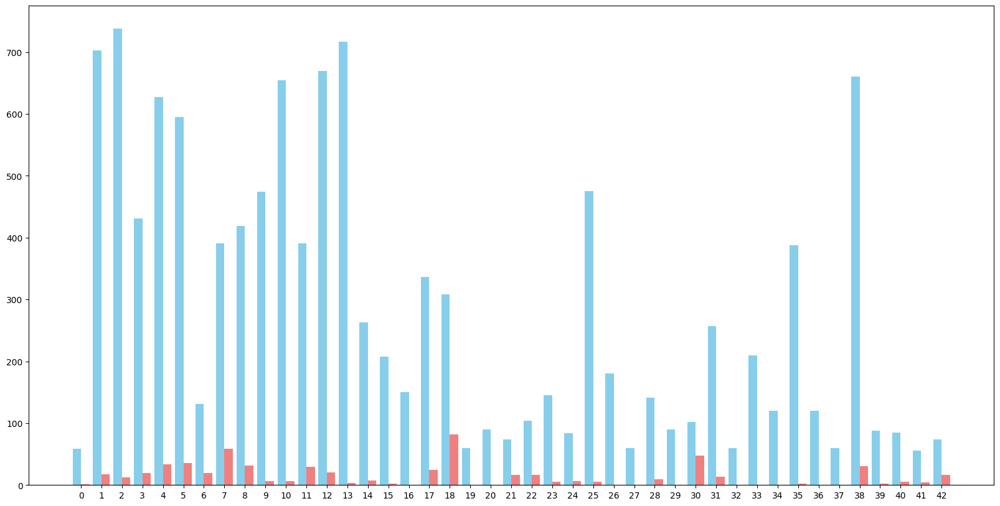

In [79]:
# 获取每个类别的正确分类数量和错误分类数量
correct_counts = np.diag(cm)  # 混淆矩阵对角线元素表示正确分类的数量
incorrect_counts = cm.sum(axis=1) - correct_counts  # 每行总和减去对角线元素表示错误分类的数量

# 绘制双色直方图
x = np.arange(43)  # 类别数量，用作 x 轴坐标
width = 0.41  # 每个柱子的宽度

fig, ax = plt.subplots(figsize=(20, 10))  # 设置图像大小

rects1 = ax.bar(x - width/2, correct_counts, width, label='true', color='skyblue')
rects2 = ax.bar(x + width/2, incorrect_counts, width, label='false', color='lightcoral')

# 设置横坐标标签
ax.set_xticks(x);

分类十八总是识别困难

## **5.2 历史版本与比较**

### 5.2.1 总览

| 方法                                          | 准确率  | Epoch |
|-----------------------------------------------|------------|----------|
| MLP+灰度图像                                 | 0.7958  | 100   |
| MLP+彩图+交叉熵损失+数据增强                 | 0.7034  | 100   |
| 32*32不变CNN+无数据预处理+铰链损失（不充分训练） | 0.9311  | 20    |
| 缩小规模的CNN+铰链损失+仿射变换、旋转、裁剪 | 0.9463  | 100   |
| 双池化层CNN+铰链损失+数据增强 | 0.9425  | 40    |
| 倒金字塔卷积核大小CNN+铰链损失+仿射变换、旋转、裁剪 | 0.9418  | 42    |
| 双池化层CNN+铰链损失+深度可分离卷积+仿射变换、旋转、裁剪 | 0.8496  | 40    |
| 双池化层CNN+交叉熵损失+仿射变换、旋转、裁剪 | 0.9342  | 40    |
| 单池化层CNN+铰链损失+仿射变换、旋转、裁剪 | 0.8437  | 40    |
| **最终版本双池化层CNN+铰链损失**    | 0.9539   |  100  |


所以选用**双池化层CNN+铰链损失+仿射变换、旋转、裁剪**做最终方法

### 5.2.2 改进过程

#### 5.2.2.1 MLP + 灰度图像（ **baseline** ）

In [ ]:
class MLP_baseline(nn.Module):
  def __init__(self):
    super(MLP_baseline, self).__init__()
    self.hidden1 = nn.Linear(1024, 512)  # 第一个隐藏层
    self.relu1 = nn.ReLU()           # ReLU激活函数
    self.hidden2 = nn.Linear(512, 256)  # 第二个隐藏层
    self.relu2 = nn.ReLU()           # ReLU激活函数
    self.hidden3 = nn.Linear(256, 128)  # 第三个隐藏层
    self.relu3 = nn.ReLU()           # ReLU激活函数
    self.output = nn.Linear(128, 43)    # 输出层

  def forward(self, x):
    x = self.hidden1(x)
    x = self.relu1(x)
    x = self.hidden2(x)
    x = self.relu2(x)
    x = self.hidden3(x)
    x = self.relu1(x)
    x = self.output(x)
    return x
model_baseline = MLP_baseline().to(device)

In [ ]:
train_transforms_baseline = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Grayscale(num_output_channels=1),
  transforms.Lambda(lambda x: x.view(-1))
])
test_transforms_baseline = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Grayscale(num_output_channels=1),
  transforms.Lambda(lambda x: x.view(-1))
])

In [ ]:
# 损失函数
criterion_baseline = nn.CrossEntropyLoss()
# 优化器
optimizer_baseline = optim.SGD(model_baseline.parameters(), lr=lr)

In [ ]:
train_dataset_baseline = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms_baseline
)

test_dataset_baseline = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_baseline
)
train_loader_baseline = DataLoader(train_dataset_baseline, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_baseline:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_baseline(x)
    # 计算损失
    loss = criterion_baseline(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_baseline.step()
    # 梯度清零
    optimizer_baseline.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()
  if epoch % 10 == 0:
    print(epoch, " ", running_loss/ len(train_loader_baseline))

0   3.61028143223308
10   1.3301280990940612
20   0.6111495870323169
30   0.3541453544448475
40   0.23334064753670222
50   0.16224602346016723
60   0.12110905996820076
70   0.08788981289062806
80   0.07922007374064091
90   0.055304329084860784


In [ ]:
model_baseline.eval()
model_baseline.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_baseline:
    predictions = model_baseline(x)
    #print(type(predictions.argmax(dim=0)),type(y))

    # dim=0是因为predictions是一个一维张量，只有一个维度
    y_pred.append(predictions.argmax(dim=0).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.795882818685669


#### 5.2.2.2 MLP + 彩图 + 交叉熵损失 + 数据增强

&emsp;&emsp;在 **baseline** 的基础上采用了数据增强技术作为数据预处理：
*   翻转图像
*   裁剪图像的一部分，模拟不同的视野范围，也使得角落的交通标志被模型“看到”
*   改变图像的亮度，模拟不同光照条件。
*   调整图像的对比度，增强或减弱图像细节。

&emsp;&emsp;对于交通标志，颜色也是很重要的特征，将数据由灰度图像换为彩色图像进行尝试，确实有了更好的结果。

&emsp;&emsp;采用了**Adam**优化器，可以使梯度下降更快。

&emsp;&emsp;运行发现损失下降特别慢，在3.12附近波动，但baseline没有这个问题，经过和最初的笔记本对比检查发现是学习率过高

In [ ]:
class MLP_2(nn.Module):
  def __init__(self):
    super(MLP_2, self).__init__()
    self.hidden1 = nn.Linear(32*32*3, 512)  # 第一个隐藏层
    self.relu1 = nn.ReLU()           # ReLU激活函数
    self.hidden2 = nn.Linear(512, 256)  # 第二个隐藏层
    self.relu2 = nn.ReLU()           # ReLU激活函数
    self.hidden3 = nn.Linear(256, 128)  # 第三个隐藏层
    self.relu3 = nn.ReLU()           # ReLU激活函数
    self.output = nn.Linear(128, 43)    # 输出层

  def forward(self, x):
    x = self.hidden1(x)
    x = self.relu1(x)
    x = self.hidden2(x)
    x = self.relu2(x)
    x = self.hidden3(x)
    x = self.relu1(x)
    x = self.output(x)
    return x
model_2 = MLP_2().to(device)

In [ ]:
train_transforms_2 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.ColorJitter(brightness=0.5, contrast=0.5), #亮度 对比度
  transforms.Lambda(lambda x: x.view(-1))
])
test_transforms_2 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Lambda(lambda x: x.view(-1))
])

In [ ]:
# 损失函数
criterion_2 = nn.CrossEntropyLoss()
# 优化器
optimizer_2 = optim.Adam(model_2.parameters(), lr=1e-3)

In [ ]:
train_dataset_2 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms_2
)

test_dataset_2 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_2
)
train_loader_2 = DataLoader(train_dataset_2, batch_size=batch_size, shuffle=True)

100%|██████████| 187M/187M [00:07<00:00, 24.9MB/s]


Extracting data/gtsrb/GTSRB-Training_fixed.zip to data/gtsrb


100%|██████████| 89.0M/89.0M [00:05<00:00, 16.9MB/s]


Extracting data/gtsrb/GTSRB_Final_Test_Images.zip to data/gtsrb


100%|██████████| 99.6k/99.6k [00:00<00:00, 221kB/s]


Extracting data/gtsrb/GTSRB_Final_Test_GT.zip to data/gtsrb


In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_2:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_2(x)
    # 计算损失
    loss = criterion_2(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_2.step()
    # 梯度清零
    optimizer_2.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()
  if epoch % 10 == 0 or epoch < 5:
    print(epoch, " ", running_loss/ len(train_loader_2))

0   3.043093165286592
1   2.470068889219506
2   2.1509296224326215
3   1.9486608120287452
4   1.8046667268868684
10   1.2211355885394624
20   0.9070580155551792
30   0.7693986861931891
40   0.7043993348369793
50   0.644910064743919
60   0.6021408818814219
70   0.5745870480123831
80   0.5550150619316645
90   0.5174033004267304


In [ ]:
model_2.eval()
model_2.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_2:
    predictions = model_2(x)
    #print(type(predictions.argmax(dim=0)),type(y))

    # dim=0是因为predictions是一个一维张量，只有一个维度
    y_pred.append(predictions.argmax(dim=0).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.7034045922406967


#### 5.2.2.3 32*32不变CNN + 无数据预处理 + 铰链损失 + 随机梯度下降（不充分训练）

&emsp;&emsp;数据增强技术只采用了仿射变换、旋转和裁剪三种最与实际情况相符的。翻转的交通标志在现实并不会出现，增加对比度增强、亮度调整、图像滤波等操作虽然可以使得数据量更大从而增加泛化能力，但在计算资源有限的情况下暂且放弃（但当时由于模型参数较多，训练慢，无法在免费的GPU额度内完成训练，所以暂未做数据处理）

In [ ]:
class CNN_3(nn.Module):
  def __init__(self):
    super(CNN_3, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=9, kernel_size=5, stride=1, padding=2)
    self.bn1 = nn.BatchNorm2d(18)
    self.conv2 = nn.Conv2d(in_channels=18, out_channels=54, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(108)
    self.conv3 = nn.Conv2d(in_channels=108, out_channels=324, kernel_size=5, stride=1, padding=2)
    self.bn3 = nn.BatchNorm2d(648)

    self.pool = nn.MaxPool2d(kernel_size=3, stride=1, padding=1)
    self.avg_pool = nn.AvgPool2d(kernel_size=3, stride=1, padding=1)

    self.fc1 = nn.Linear(648 * 32 * 32, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)
    x = self.bn1(x)

    x = F.relu(self.conv2(x))
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)
    x = self.bn2(x)

    x = F.relu(self.conv3(x))
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_3 = CNN_3().to(device)

In [ ]:
train_transforms_3 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_3 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_3 = nn.MultiMarginLoss()
# 优化器
optimizer_3 = optim.Adam(model_3.parameters(), lr=lr)

In [ ]:
train_dataset_3 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms_3
)

test_dataset_3 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_3
)
train_loader_3 = DataLoader(train_dataset_3, batch_size=batch_size, shuffle=True)

100%|██████████| 187M/187M [00:14<00:00, 12.8MB/s]


Extracting data/gtsrb/GTSRB-Training_fixed.zip to data/gtsrb


100%|██████████| 89.0M/89.0M [00:06<00:00, 14.5MB/s]


Extracting data/gtsrb/GTSRB_Final_Test_Images.zip to data/gtsrb


100%|██████████| 99.6k/99.6k [00:00<00:00, 145kB/s]

Extracting data/gtsrb/GTSRB_Final_Test_GT.zip to data/gtsrb


In [ ]:
for epoch in range(40):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_3:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_3(x)
    # 计算损失
    loss = criterion_3(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_3.step()
    # 梯度清零
    optimizer_3.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()
  print(epoch, " ", running_loss/ len(train_loader_3))

0   5.513288791833662
1   0.689361520997044
2   0.6503814874934692
3   0.6485561066958941


KeyboardInterrupt: 

In [ ]:
model_3.eval()
model_3.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_3:
    x = x.unsqueeze(0)  # 添加一个批量维度，变成 (1, channels, height, width)
    predictions = model_3(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

在其他代码段跑出 **0.9311** 的准确率，由于计算资源原因，这里不再重复运行。

#### 5.2.2.4 缩小规模的CNN + 铰链损失 + 仿射变换、旋转、裁剪

&emsp;&emsp;之前的CNN较大，训练速度慢，采用更小的网络做。

In [ ]:
class CNN_4(nn.Module):
  def __init__(self):
    super(CNN_4, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, stride=1, padding=1)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1, padding=1)
    self.bn2 = nn.BatchNorm2d(128)
    self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))             # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.conv2(x))             # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.conv3(x))             # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  #512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_4 = CNN_4().to(device)

In [ ]:
train_transforms_4 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_4 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_4 = nn.MultiMarginLoss()
# 优化器
optimizer_4 = optim.Adam(model_4.parameters(), lr=lr)

In [ ]:
train_dataset_4 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms_4
)

test_dataset_4 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_4
)
train_loader_4 = DataLoader(train_dataset_4, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_4:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_4(x)
    # 计算损失
    loss = criterion_4(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_4.step()
    # 梯度清零
    optimizer_4.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()
  if epoch % 10 == 0:
    print(epoch, " ", running_loss/ len(train_loader_4))

0   0.4076871362750699
10   0.015763360820473075
20   0.014894717476159704
30   0.012680058571328503
40   0.005851628235087819
50   0.007950823077385748
60   0.008751720154147742
70   0.010033788967931202
80   0.006515899674257259
90   0.009384976088580077


In [ ]:
model_4.eval()
model_4.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_4:
    x = x.unsqueeze(0)  # 添加一个批量维度，变成 (1, channels, height, width)
    predictions = model_4(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.9463182897862232


#### 5.2.2.5 双池化层CNN + 铰链损失 + 仿射变换、旋转、裁剪

&emsp;&emsp;从**5.2.2.3**和**5.2.2.4**的结果对比容易发现，**5.2.2.3**的CNN在训练并不充分的情况下结果不必新的网络差多少，而不同的地方在于网络结构的不同还有是否做了数据预处理，经过测试数据预处理对图像结果有益，所以是网络结构的差异。

&emsp;&emsp;而结合对图像的观察，可以想到图片大小为 **32*32**，目标在图中的占比并不小，**5*5** 的卷积核可能可以更好的捕获全局的特征，池化层暂时觉得没有问题。所以做以下测试：

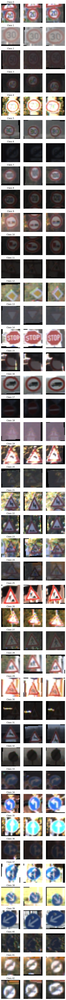

In [ ]:
plot_samples_per_class(train_dataset_5)

In [ ]:
class CNN_5(nn.Module):
  def __init__(self):
    super(CNN_5, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=1, padding=2)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(128)
    self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=5, stride=1, padding=2)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))             # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.conv2(x))             # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.conv3(x))             # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  #512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_5 = CNN_5().to(device)

In [ ]:
train_transforms_5 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_5 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_5 = nn.MultiMarginLoss()
# 优化器
optimizer_5 = optim.Adam(model_5.parameters(), lr=1e-3)

In [ ]:
train_dataset_5 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transforms_5
)

test_dataset_5 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_5
)
train_loader_5 = DataLoader(train_dataset_5, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_5:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_5(x)
    # 计算损失
    loss = criterion_5(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_5.step()
    # 梯度清零
    optimizer_5.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  print(epoch, " ", running_loss/ len(train_loader_5))

0   0.5150362915602051
1   0.20358887795998412
2   0.1255148656639446
3   0.08342661537981334
4   0.05681861039040899
5   0.03719266951710236
6   0.027599269853477753
7   0.03684717240672903
8   0.024300916408862817
9   0.021667511842888863
10   0.0169008285557546
20   0.009879631173924232
30   0.008315196339428236
40   0.001940080935343435


KeyboardInterrupt: 

运行36分钟，跑了40个epoch。

In [ ]:
model_5.eval()
model_5.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_5:
    x = x.unsqueeze(0)  # 添加一个批量维度，变成 (1, channels, height, width)
    predictions = model_5(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.942596991290578


#### 5.2.2.6 倒金字塔卷积核大小CNN + 铰链损失 + 仿射变换、旋转、裁剪

&emsp;&emsp;可以看到上一个模型在训练时比 **3*3** 卷积核的模型结果确实要好。

&emsp;&emsp;但我认为第一层卷积核可以更大，我打算采用大小分别为 **7*7**，**5*5**，**3*3** 的卷积核做尝试

In [ ]:
class CNN_6(nn.Module):
  def __init__(self):
    super(CNN_6, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=7, stride=1, padding=3)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(128)
    self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, stride=1, padding=1)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))             # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.conv2(x))             # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.conv3(x))             # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  #512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_6 = CNN_6().to(device)

In [ ]:
train_transform_6 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_6 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_6 = nn.MultiMarginLoss()
# 优化器
optimizer_6 = optim.Adam(model_6.parameters(), lr=1e-3)

scheduler_6 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_6, factor=0.1, patience=5, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
train_dataset_6 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transform_6
)

test_dataset_6 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_6
)
train_loader_6 = DataLoader(train_dataset_6, batch_size=batch_size, shuffle=True)

100%|██████████| 187M/187M [00:02<00:00, 77.8MB/s]


Extracting data/gtsrb/GTSRB-Training_fixed.zip to data/gtsrb


100%|██████████| 89.0M/89.0M [00:00<00:00, 125MB/s]


Extracting data/gtsrb/GTSRB_Final_Test_Images.zip to data/gtsrb


100%|██████████| 99.6k/99.6k [00:00<00:00, 1.44MB/s]

Extracting data/gtsrb/GTSRB_Final_Test_GT.zip to data/gtsrb


In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_6:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_6(x)
    # 计算损失
    loss = criterion_6(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_6.step()
    # 梯度清零
    optimizer_6.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  scheduler_6.step(running_loss / len(train_loader_6))
  print(epoch, " ", running_loss/ len(train_loader_6))

0   0.5472333270068072
1   0.22825099815841482
2   0.14248524624116424
3   0.09558107383271941
4   0.05726848977382014
5   0.05224428219063317
6   0.03794839247973973
7   0.026930726682241796
8   0.024850539351608896
9   0.0288403861214589
10   0.019369665608841406
11   0.01462937772292989
12   0.025719094973410808
13   0.016606777380871848
14   0.017397176361830607
15   0.01779332610385609
16   0.014654091856963798
17   0.014009887413396377
18   0.012913958370401404
19   0.015026224331161823
20   0.01088968390757916
21   0.010721138467697976
22   0.01779877578726092
23   0.010124621818408987
24   0.009918989124405222
25   0.012469609025371243
26   0.013718176640559316
27   0.007508053843986065
28   0.007892018950547256
29   0.012984661940304834
30   0.006558499606487693
31   0.008910361812576819
32   0.012415793338215521
33   0.009216902474259596
34   0.00888938904143802
35   0.00965362863020933
36   0.017963954666690138
37   0.005655205298804184
38   0.004540567076115094
39   0.00426

KeyboardInterrupt: 

运行37分，42个epoch

In [ ]:
model_6.eval()
model_6.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_6:
    x = x.unsqueeze(0)
    predictions = model_6(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.9418844022169438


#### ~~5.2.2.7 （5.2.2.5对照组）深度可分离卷积 + 铰链损失 + 仿射变换、旋转、裁剪~~（SGD+调度器太慢）



&emsp;&emsp;**5.2.2.5** 的模型目前最适合，效果好，训练速度较快；**5.2.2.3** 虽然效果更好，但参数过多，太大了。
&emsp;&emsp;

In [ ]:
class CNN_7(nn.Module):
  def __init__(self):
    super(CNN_7, self).__init__()
    # 深度可分离卷积第1层
    self.depthwise1 = nn.Conv2d(3, 3, kernel_size=5, stride=1, padding=2, groups=3)
    self.pointwise1 = nn.Conv2d(3, 16, kernel_size=1)
    self.bn1 = nn.BatchNorm2d(32)

    # 深度可分离卷积第2层
    self.depthwise2 = nn.Conv2d(32, 32, kernel_size=5, stride=1, padding=2, groups=32)
    self.pointwise2 = nn.Conv2d(32, 64, kernel_size=1)
    self.bn2 = nn.BatchNorm2d(128)

    # 深度可分离卷积第3层
    self.depthwise3 = nn.Conv2d(128, 128, kernel_size=5, stride=1, padding=2, groups=128)
    self.pointwise3 = nn.Conv2d(128, 256, kernel_size=1)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.pointwise1(self.depthwise1(x)))   # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.pointwise2(self.depthwise2(x)))   # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.pointwise3(self.depthwise3(x)))   # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_7 = CNN_7().to(device)

In [ ]:
train_transform_7 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_7 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_7 = nn.MultiMarginLoss()
# 优化器
optimizer_7 = optim.SGD(model_7.parameters(), lr=1e-3)

scheduler_7 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_7, factor=0.1, patience=5, verbose=True)

In [ ]:
train_dataset_7 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transform_7
)

test_dataset_7 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_7
)
train_loader_7 = DataLoader(train_dataset_7, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(epochs):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_7:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_7(x)
    # 计算损失
    loss = criterion_7(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_7.step()
    # 梯度清零
    optimizer_7.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  scheduler_7.step(running_loss / len(train_loader_7))
  print(epoch, " ", running_loss/ len(train_loader_7))

0   0.8162031891394634
1   0.6115702505157489
2   0.532098525354699
3   0.4735264028249239
4   0.4373625509378289
5   0.40465633639124404
6   0.3813793504295372
7   0.3520242398669597
8   0.3308826470646967
9   0.31105331178544376
10   0.29325738125273876
11   0.2789591038677873
12   0.26520425093775035
13   0.2510696225592784
14   0.2384523172803572
15   0.22972637136765317
16   0.21909998673028877
17   0.20949006392782618
18   0.20248351823918673
19   0.19592926972338848
20   0.1901552174933532
21   0.18620632872396872
22   0.17653187123738848
23   0.1739144416040733
24   0.16901212624785136
25   0.16403836524393522
26   0.1630906288703235
27   0.15903216194348033
28   0.1550594205964728
29   0.15315088663710838
30   0.1484966732713641


KeyboardInterrupt: 

In [ ]:
model_7.eval()
model_7.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_7:
    x = x.unsqueeze(0)
    predictions = model_7(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.4068091844813935


#### 5.2.2.7 （5.2.2.5对照组）深度可分离卷积 + 铰链损失 + 仿射变换、旋转、裁剪

&emsp;&emsp;**5.2.2.5** 的模型目前最适合，效果好，训练速度较快；**5.2.2.3** 虽然效果更好，但参数过多，太大了。

&emsp;&emsp;基于 **5.2.2.5** 做深度可分离卷积，以求减少计算量，与**5.2.2.5** 做对比。

In [ ]:
class CNN_7(nn.Module):
  def __init__(self):
    super(CNN_7, self).__init__()
    # 深度可分离卷积第1层
    self.depthwise1 = nn.Conv2d(3, 3, kernel_size=5, stride=1, padding=2, groups=3)
    self.pointwise1 = nn.Conv2d(3, 16, kernel_size=1)
    self.bn1 = nn.BatchNorm2d(32)

    # 深度可分离卷积第2层
    self.depthwise2 = nn.Conv2d(32, 32, kernel_size=5, stride=1, padding=2, groups=32)
    self.pointwise2 = nn.Conv2d(32, 64, kernel_size=1)
    self.bn2 = nn.BatchNorm2d(128)

    # 深度可分离卷积第3层
    self.depthwise3 = nn.Conv2d(128, 128, kernel_size=5, stride=1, padding=2, groups=128)
    self.pointwise3 = nn.Conv2d(128, 256, kernel_size=1)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.pointwise1(self.depthwise1(x)))   # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.pointwise2(self.depthwise2(x)))   # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.pointwise3(self.depthwise3(x)))   # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_7 = CNN_7().to(device)

In [ ]:
train_transform_7 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_7 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_7 = nn.MultiMarginLoss()
# 优化器
optimizer_7 = optim.Adam(model_7.parameters(), lr=1e-3)

In [ ]:
train_dataset_7 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transform_7
)

test_dataset_7 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_7
)
train_loader_7 = DataLoader(train_dataset_7, batch_size=batch_size, shuffle=True)

100%|██████████| 187M/187M [00:12<00:00, 15.3MB/s]


Extracting data/gtsrb/GTSRB-Training_fixed.zip to data/gtsrb


100%|██████████| 89.0M/89.0M [00:07<00:00, 11.3MB/s]


Extracting data/gtsrb/GTSRB_Final_Test_Images.zip to data/gtsrb


100%|██████████| 99.6k/99.6k [00:00<00:00, 148kB/s]

Extracting data/gtsrb/GTSRB_Final_Test_GT.zip to data/gtsrb


In [ ]:
for epoch in range(40):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_7:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_7(x)
    # 计算损失
    loss = criterion_7(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_7.step()
    # 梯度清零
    optimizer_7.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  print(epoch, " ", running_loss/ len(train_loader_7))

0   0.35155110731989253
1   0.12016295607225234
2   0.08182132963229771
3   0.06440832195322768
4   0.05115668426098979
5   0.043828251620694224
6   0.03687667268823658
7   0.03396430433339843
8   0.03076360157259381
9   0.03240219241084748
10   0.028474299519435736
11   0.028794525919587206
12   0.02801617485971949
13   0.0253447789300819
14   0.02476660729626849
15   0.021371813319997452
16   0.022843179074261397
17   0.024739333716755574
18   0.019073035447460814
19   0.0192948826451207
20   0.021452582425810034
21   0.020047784928218508
22   0.01801707764203819
23   0.014885582021390557
24   0.021313086552018554
25   0.020139954778364954
26   0.018823295810979194
27   0.01857249756455169
28   0.016136558944445538
29   0.01714134950995739
30   0.015436377461511318
31   0.014202096520594638
32   0.016201331384879496
33   0.019268366731417134
34   0.01573353740253811
35   0.01237286220719022
36   0.016553565853733868
37   0.014611338598578223
38   0.014401539166015175
39   0.013288428

In [ ]:
model_7.eval()
model_7.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_7:
    x = x.unsqueeze(0)
    predictions = model_7(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.8496437054631829


从训练过程看到可能陷入局部最优，效果一般。

#### 5.2.2.8 （5.2.2.5对照组）双池化层CNN + 交叉熵损失 + 仿射变换、旋转、裁剪

&emsp;&emsp; **5.2.2.5** 换回交叉熵损失做对比。

In [ ]:
class CNN_8(nn.Module):
  def __init__(self):
    super(CNN_8, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=1, padding=2)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(128)
    self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=5, stride=1, padding=2)
    self.bn3 = nn.BatchNorm2d(512)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
    self.avg_pool = nn.AvgPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(512 * 4 * 4, 1024)
    self.fc2 = nn.Linear(1024, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))             # 16*32*32
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 32*16*16
    x = self.bn1(x)

    x = F.relu(self.conv2(x))             # 64*16*16
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  # 128*8*8
    x = self.bn2(x)

    x = F.relu(self.conv3(x))             # 256*8*8
    x = torch.cat((self.pool(x), self.avg_pool(x)), dim=1)  #512*4*4
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_8 = CNN_8().to(device)

In [ ]:
train_transform_8 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_8 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_8 = nn.CrossEntropyLoss()
# 优化器
optimizer_8 = optim.Adam(model_8.parameters(), lr=1e-3)

In [ ]:
train_dataset_8 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transform_8
)

test_dataset_8 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_8
)
train_loader_8 = DataLoader(train_dataset_8, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(40):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_8:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_8(x)
    # 计算损失
    loss = criterion_8(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_8.step()
    # 梯度清零
    optimizer_8.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  print(epoch, " ", running_loss/ len(train_loader_8))

0   3.361127620985528
1   2.477398609628483
2   1.9058791315999208
3   1.5221755272057018
4   1.119228422605977
5   0.8450729050735036
6   0.5790946437727933
7   0.4522544206561697
8   0.3653007027584643
9   0.2775665233336559
10   0.2591665665108134
11   0.21401086080741666
12   0.20083917367280743
13   0.2039488845065363
14   0.18996619367501044
15   0.1546781549346843
16   0.1412334173819152
17   0.1394692029373747
18   0.1482920385209132
19   0.18069713528950956
20   0.11750842663271227
21   0.13674891485117938
22   0.11133273225400384
23   0.1342205443490472
24   0.10089279076271003
25   0.12322845020558283
26   0.09467533903393281
27   0.1053956010537545
28   0.11538008256987772
29   0.0965483525196262
30   0.09422833445873864
31   0.10505825342144413
32   0.08601276867369645
33   0.10595129877210023
34   0.10538841588038238
35   0.08361709975921411
36   0.09179056617637667
37   0.08500684317026175
38   0.09317982421926103
39   0.0687342753286841


In [ ]:
model_8.eval()
model_8.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_8:
    x = x.unsqueeze(0)
    predictions = model_8(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.9342042755344419


#### 5.2.2.9 （5.2.2.5对照组）单池化层CNN + 铰链损失 + 仿射变换、旋转、裁剪

&emsp;&emsp;**5.2.2.5** 的单池化层版本与 **5.2.2.5** 做对比。

In [ ]:
class CNN_9(nn.Module):
  def __init__(self):
    super(CNN_9, self).__init__()
    self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=5, stride=1, padding=2)
    self.bn1 = nn.BatchNorm2d(16)
    self.conv2 = nn.Conv2d(in_channels=16, out_channels=64, kernel_size=5, stride=1, padding=2)
    self.bn2 = nn.BatchNorm2d(64)
    self.conv3 = nn.Conv2d(in_channels=64, out_channels=256, kernel_size=5, stride=1, padding=2)
    self.bn3 = nn.BatchNorm2d(256)

    self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    self.fc1 = nn.Linear(256 * 4 * 4, 512)
    self.fc2 = nn.Linear(512, 128)
    self.fc3 = nn.Linear(128, 43)
    self.dropout = nn.Dropout(p=0.5)

  def forward(self, x):
    x = F.relu(self.conv1(x))
    x = self.pool(x)
    x = self.bn1(x)

    x = F.relu(self.conv2(x))
    x = self.pool(x)
    x = self.bn2(x)

    x = F.relu(self.conv3(x))
    x = self.pool(x)
    x = self.bn3(x)

    x = x.view(x.size(0), -1)

    x = F.relu(self.fc1(x))
    x = self.dropout(x)

    x = F.relu(self.fc2(x))
    x = self.dropout(x)

    x = self.fc3(x)

    return x

model_9 = CNN_9().to(device)

In [ ]:
train_transform_9 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
  transforms.RandomRotation(degrees=(-5, 5)),
  transforms.RandomResizedCrop(size=32, scale=(0.75, 1.25)),
  transforms.GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 2.0)),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transforms_9 = transforms.Compose([
  transforms.Resize((32, 32)),
  transforms.ToTensor(),
  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# 损失函数
criterion_9 = nn.MultiMarginLoss()
# 优化器
optimizer_9 = optim.Adam(model_9.parameters(), lr=1e-3)

In [ ]:
train_dataset_9 = torchvision.datasets.GTSRB(
    root='./data',
    split='train',
    download=True,
    transform=train_transform_9
)

test_dataset_9 = torchvision.datasets.GTSRB(
    root='./data',
    split='test',
    download=True,
    transform=test_transforms_9
)
train_loader_9 = DataLoader(train_dataset_9, batch_size=batch_size, shuffle=True)

In [ ]:
for epoch in range(40):
  running_loss = 0.0
  i = 0
  for x, y in train_loader_9:
    x = x.to(device)  # 将输入数据移动到GPU
    y = y.to(device)  # 将目标数据移动到GPU
    # 前向传播
    predictions = model_9(x)
    # 计算损失
    loss = criterion_9(predictions, y)
    # 反向传播
    loss.backward()
    # 更新参数
    optimizer_9.step()
    # 梯度清零
    optimizer_9.zero_grad()

    # 记录
    i += 1
    running_loss += loss.item()

  print(epoch, " ", running_loss/ len(train_loader_9))

0   0.38919812184171515
1   0.13330414496353266
2   0.07026473562024077
3   0.040012179995749464
4   0.02769718026308542
5   0.02750327818750852
6   0.015276425576110992
7   0.01459495567345451
8   0.017254585835610747
9   0.014897850962254551
10   0.011077581740066978
11   0.012157773303521422
12   0.02023938110149978
13   0.012096709095071986
14   0.009031357438291162
15   0.009707676760753434
16   0.009109634411625255
17   0.008509816594915301
18   0.0107501188458551
19   0.006911395821769546
20   0.009559419715838288
21   0.013810450598749649
22   0.010494871930355091
23   0.006752877689990589
24   0.0051205590578463
25   0.006522732887754305
26   0.00802949420016657
27   0.006061790504474334
28   0.005581063080397052
29   0.012898775119894668
30   0.005026587386283791
31   0.00609106111804191
32   0.007651573075113944
33   0.005708719049888008
34   0.00737730536544221
35   0.006085506905792073
36   0.006150714640352162
37   0.008363596117504847
38   0.010855877568548142
39   0.004

In [ ]:
model_9.eval()
model_9.to("cpu")

y_pred = []
y_true = []

with torch.no_grad():
  for x, y in test_dataset_9:
    x = x.unsqueeze(0)
    predictions = model_7(x)

    y_pred.append(predictions.argmax(dim=1).reshape(-1))
    y_true.append(y)

accuracy = accuracy_score(y_true, y_pred)
print(f"准确率: {accuracy}")

准确率: 0.8437054631828979


# **6 结论（Conclusion）**

&emsp;&emsp;经过不断测试与调整，发现双池化层卷积神经网络对交通标志识别有着良好效果。
&emsp;&emsp;通过本次实验，对CNN有了更深的理解。

# **7 参考文献（References）**

[1] 伍晓晖,  田启川.  交通标志识别方法综述[J].  计算机工程与应用, 2020, 56(10): 20-26.<br><br>
[2]	Sermanet P, LeCun Y. Traffic sign recognition with multi-scale convolutional networks. Proceedings of 2011 International Joint Conference on Neural Networks. San Jose, CA, USA. 2011. 2809–2813.<br><br>
[3] Ciresan D C, Meier U, Gambardella L M, et al. Convolutional neural network committees forhandwritten character classification[C]//Proceedings of IEEE International Conference on DocumentAnalysis and Recognition, Beijing, China, 2011,1 (3): 1250-1254.<br><br>
[4]Hamed Habibi Aghdam, Elnaz Jahani Heravi, Domenec Puig, "Toward an optimal convolutional neural network for traffic sign recognition," Proc. SPIE 9875, Eighth International Conference on Machine Vision (ICMV 2015), 98750K (8 December 2015).<br><br>
[5]J. Jin, K. Fu and C. Zhang, "Traffic Sign Recognition With Hinge Loss Trained Convolutional Neural Networks," in IEEE Transactions on Intelligent Transportation Systems, vol. 15, no. 5, pp. 1991-2000, Oct. 2014, doi: 10.1109/TITS.2014.2308281.<br><br>
[6]Giusti A, Ciresan DC, Masci J, et al. Fast image scanning with deep max-pooling convolutional neural networks. Proceedings of 2013 IEEE International Conference on Image Processing. Melbourne, VIC, Australia. 2013. 4034–4038.<br><br>
